

# iMaterialist Challenge (Furniture) at FGVC5
The idea is to load, visualize and test algorithms with sample data. This is done on my laptop with NVIDIA GEForce GTX 1050Ti. 
The whole training, validation and testing datasets for the kaggle competition are loaded to IBM cloud storage and experiemnts will be run on IBM watson studio.

## Load and Visualize sample data (5 GB training and 2 GB validation)

In [1]:
import numpy as np
import h5py, json, time, os
from PIL import Image
import matplotlib.pyplot as plt
import config
import torch
from torch.utils.data import Dataset
from torchvision import transforms, utils
import transforms
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import dataset, transforms, image_classifier, models, lr_scheduler_new, error_analysis
from transforms import ToNumpy, denormalize
from lr_scheduler_new import *
from dataset import FurnitureDataset
import cv2
import pdb
from image_classifier import Classifier

C:\Users\vinit\Anaconda3\envs\pytorch\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
# Helper functions
def elapsed (start):
    """
    Returns elapsed time in hh:mm:ss format from start time in unix format
    """
    elapsed = time.time()-start
    hours, rem = divmod(elapsed, 3600)
    minutes, seconds = divmod(rem, 60)
    return("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

In [4]:
# To read h5 files into memory
dataset_name = 'train_1'
start=time.time()
with h5py.File('data/Sample/{}_images.h5'.format(dataset_name), 'r') as hf:
    images = hf['{}_images'.format(dataset_name)][:]
    print(images.shape)
with h5py.File('data/Sample/{}_labels.h5'.format(dataset_name), 'r') as hf:
    labels = hf['{}_labels'.format(dataset_name)][:]
    print(labels.shape)
print('Loaded {}_dataset in {}'.format(dataset_name,elapsed(start)))

(20000, 300, 300, 3)
(20000,)
Loaded train_1_dataset in 00:00:05.75


In [12]:
#hf = h5py.File('data/Sample/train_1_images.h5', 'r')

In [15]:
#image = hf['train_1_images'][4]

In [23]:
#hf["train_1_images"].shape

(20000, 300, 300, 3)

In [ ]:
# Create a classes list of used labels
classes = []
for i in range (1,len(labels)):
    if labels[i] not in classes:
        classes.append(labels[i])
        
print(sorted(classes))


In [7]:
# Group images into classified categories
# Caution: This copies images into a new dictionary which doubles the memory use.
classified = {}
for img_class in classes:
    classified[img_class] = []
    count = 0
    for i in range (len(images)):
        image = images[i]
        label = labels[i]
        
        if label == img_class:
            classified[img_class].append(image)
            count +=1
    print(img_class, count)
print(classified.keys())

14 200
87 172
99 202
81 162
73 242
119 130
34 69
7 159
5 169
53 117
83 23
10 202
86 62
103 220
24 184
89 241
109 76
20 404
12 265
100 138
94 138
117 234
76 204
112 177
93 236
114 71
8 136
72 155
61 197
84 121
4 153
85 72
90 129
3 238
125 276
88 135
97 93
48 131
1 147
75 190
92 271
64 196
67 102
50 132
56 180
13 180
68 235
40 201
49 192
37 236
21 251
31 215
52 119
38 247
79 160
35 69
39 122
60 169
123 199
104 209
122 250
108 165
118 175
78 202
69 118
42 421
101 181
27 238
30 124
25 57
26 161
128 134
15 121
80 158
2 167
17 136
55 220
115 88
28 175
33 124
102 148
16 149
126 207
98 199
32 180
110 74
116 203
19 80
127 73
113 136
63 186
59 147
120 206
43 169
106 96
71 133
36 165
29 137
46 143
11 196
74 66
47 71
22 154
105 82
51 86
70 155
111 215
6 117
77 65
121 44
54 194
18 164
45 234
41 58
96 146
44 143
58 68
95 126
91 224
82 117
65 140
66 37
107 184
57 60
23 111
62 64
124 38
9 40
dict_keys([14, 87, 99, 81, 73, 119, 34, 7, 5, 53, 83, 10, 86, 103, 24, 89, 109, 20, 12, 100, 94, 117, 76, 112, 

1


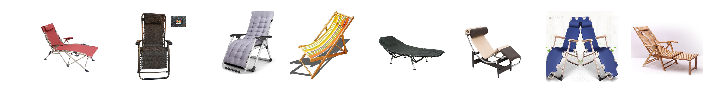

2


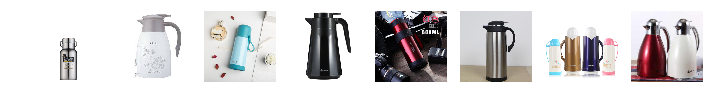

3


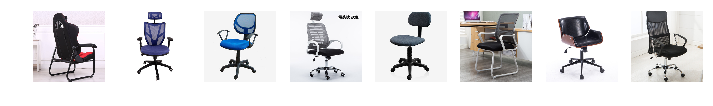

4


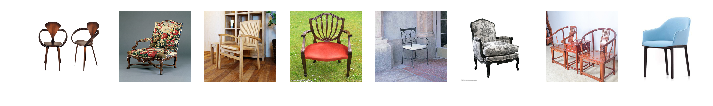

5


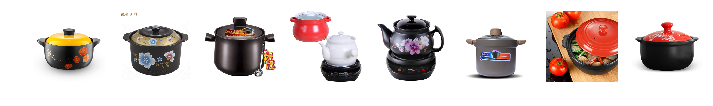

6


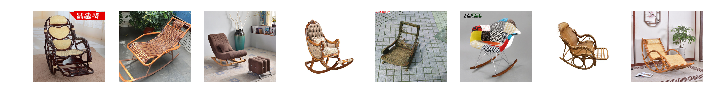

7


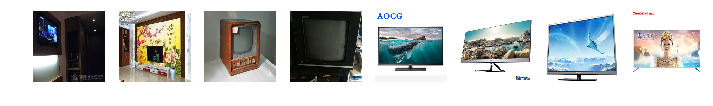

8


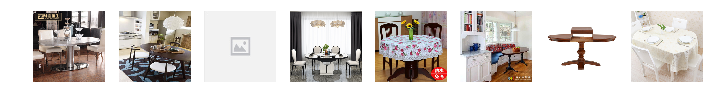

9


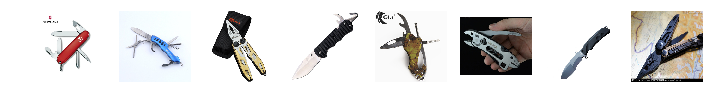

10


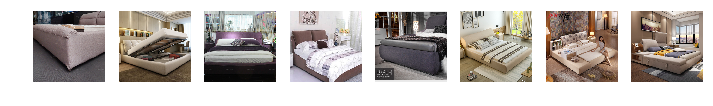

11


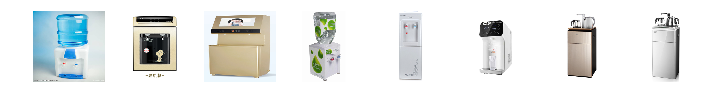

12


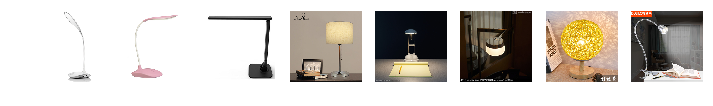

13


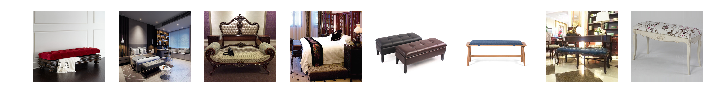

14


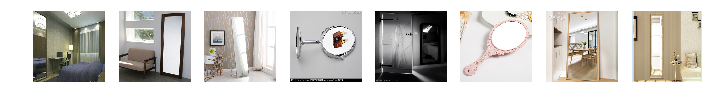

15


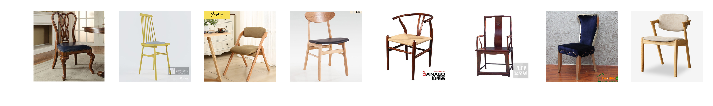

16


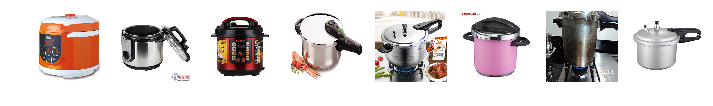

17


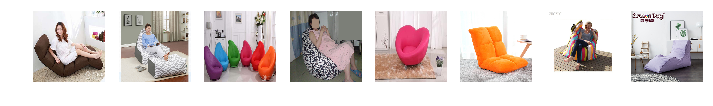

18


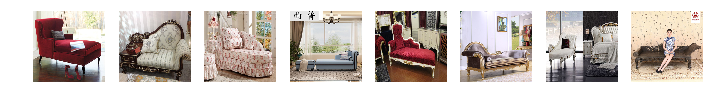

19


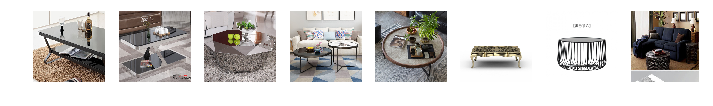

20


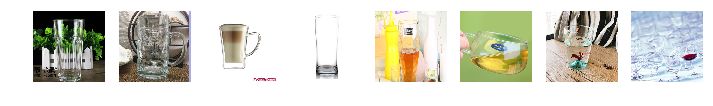

21


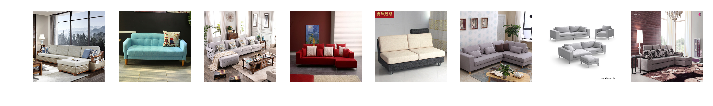

22


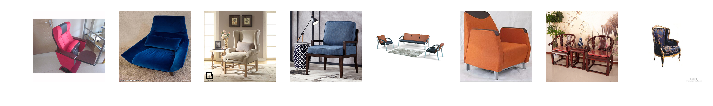

23


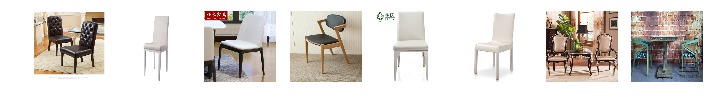

24


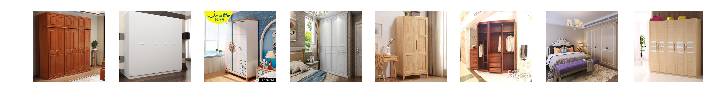

25


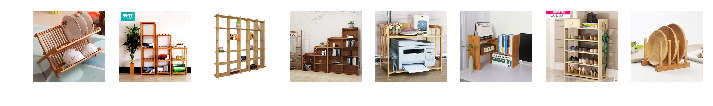

26


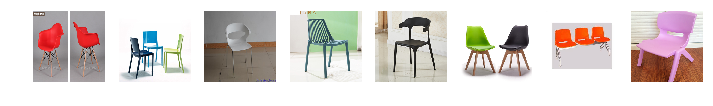

27


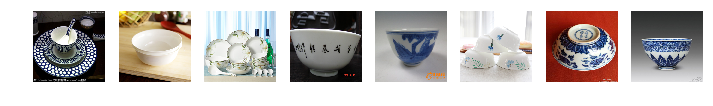

28


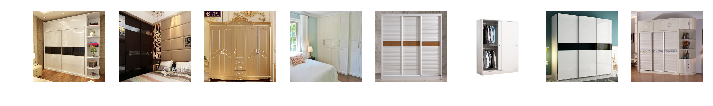

29


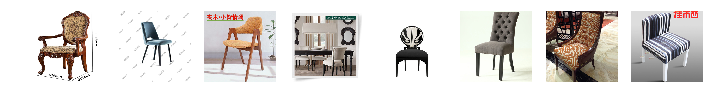

30


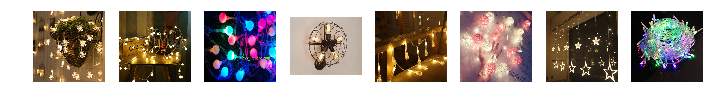

31


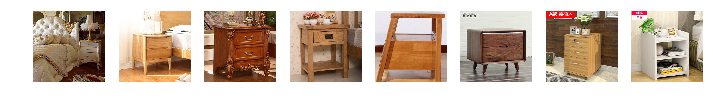

32


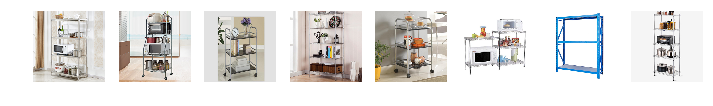

33


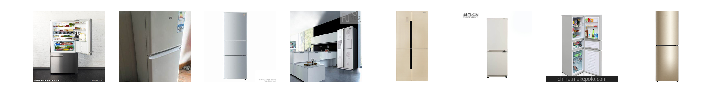

34


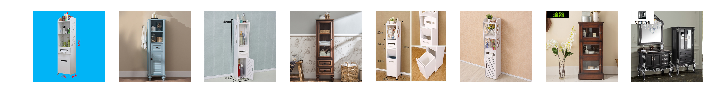

35


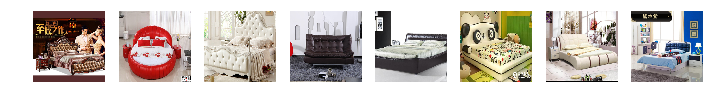

36


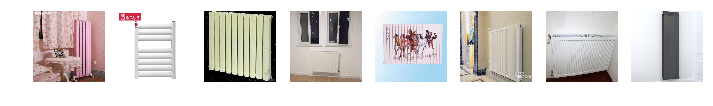

37


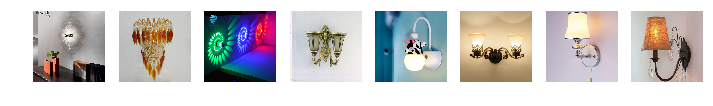

38


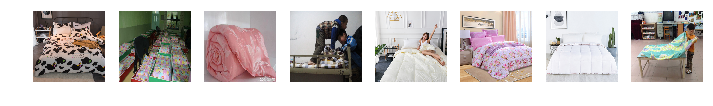

39


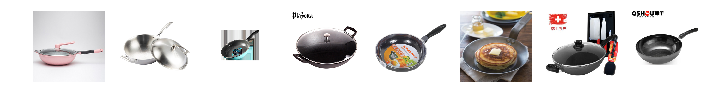

40


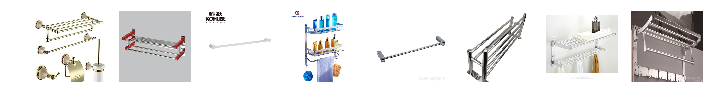

41


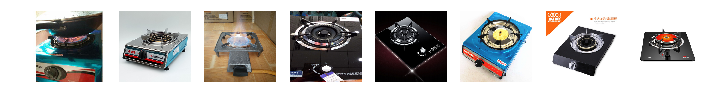

42


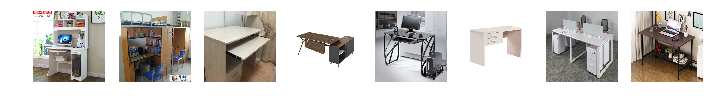

43


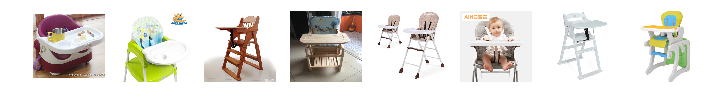

44


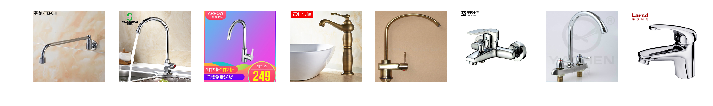

45


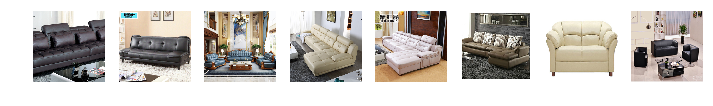

46


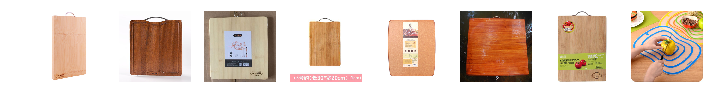

47


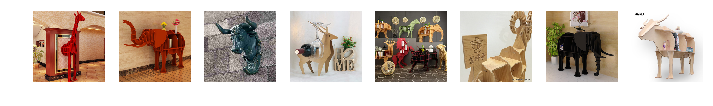

48


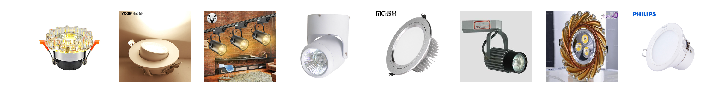

49


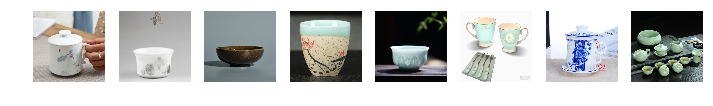

50


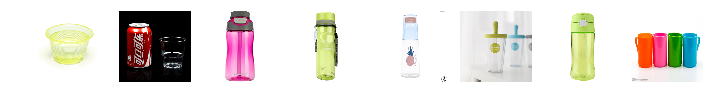

51


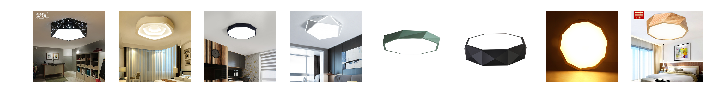

52


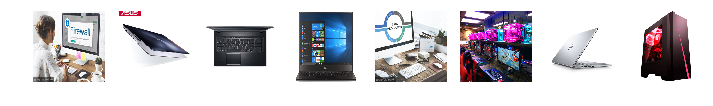

53


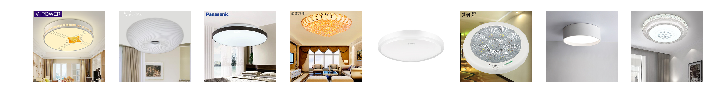

54


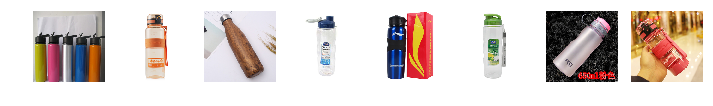

55


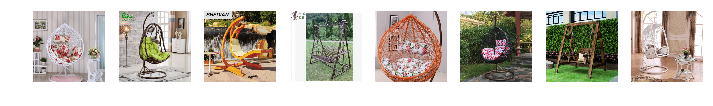

56


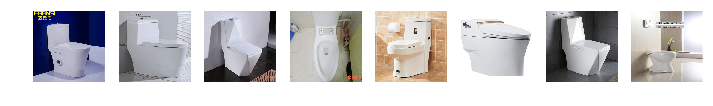

57


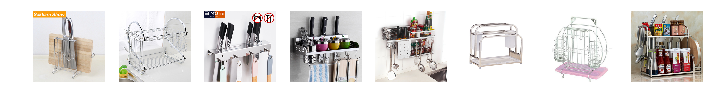

58


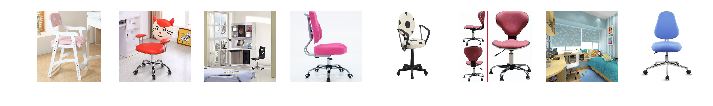

59


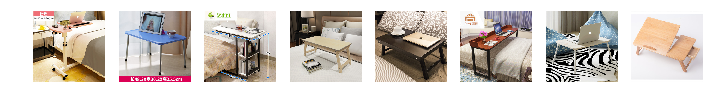

60


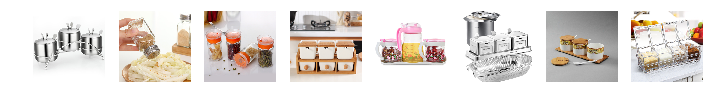

61


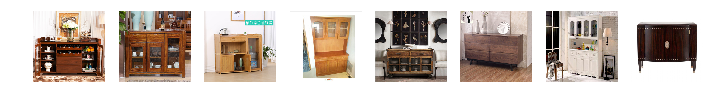

62


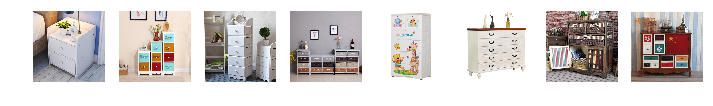

63


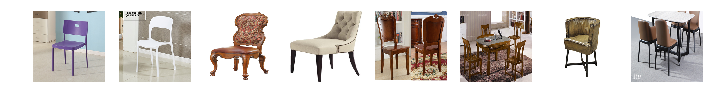

64


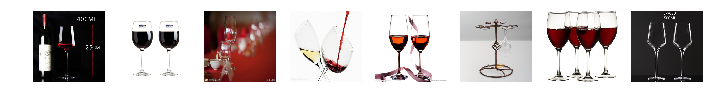

65


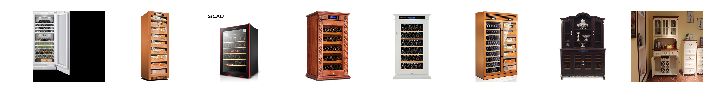

66


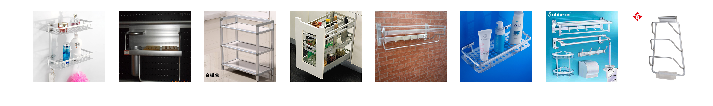

67


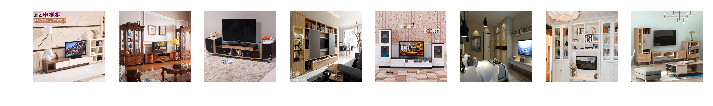

68


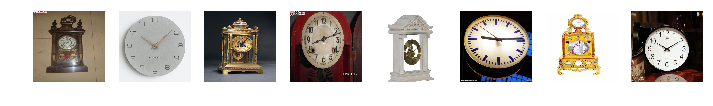

69


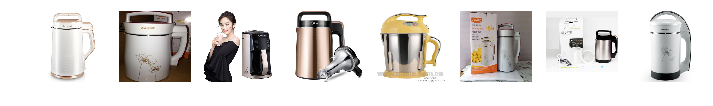

70


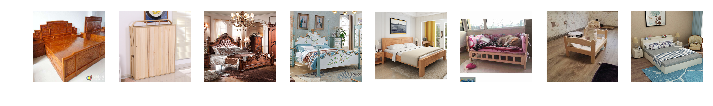

71


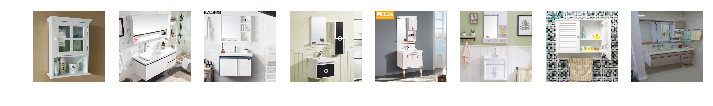

72


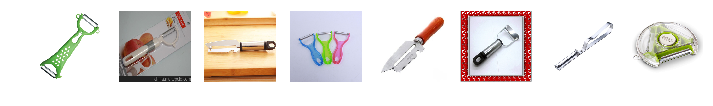

73


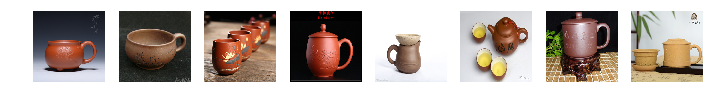

74


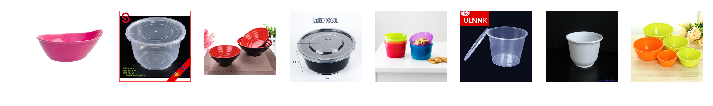

75


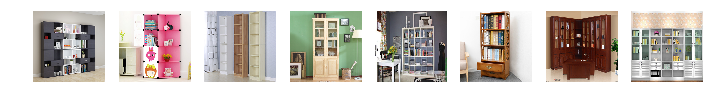

76


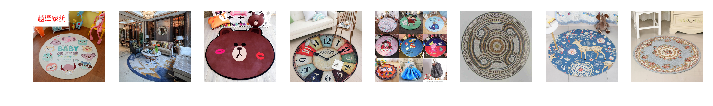

77


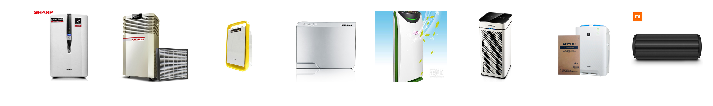

78


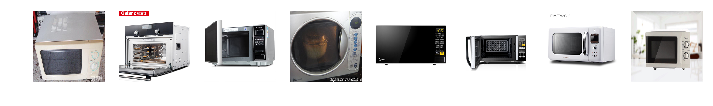

79


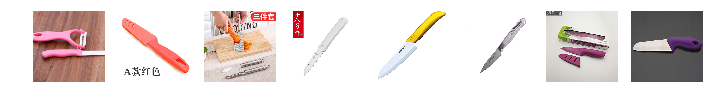

80


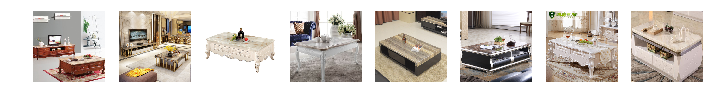

81


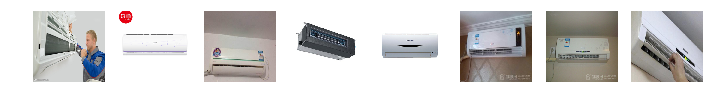

82


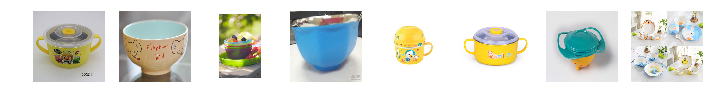

83


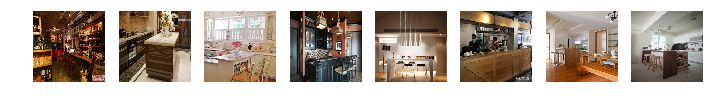

84


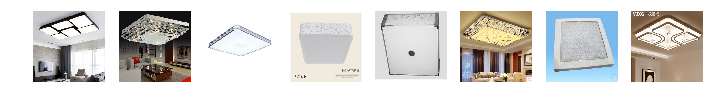

85


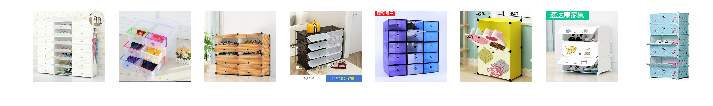

86


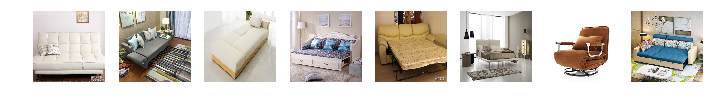

87


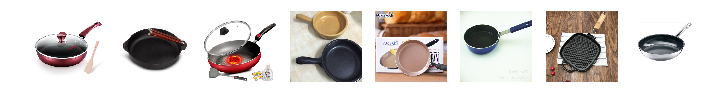

88


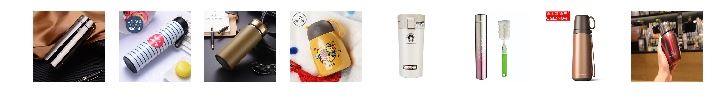

89


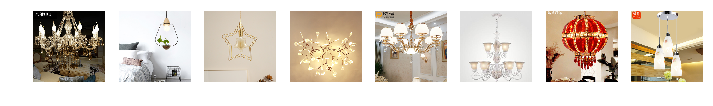

90


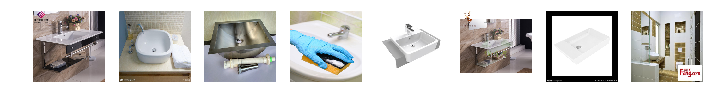

91


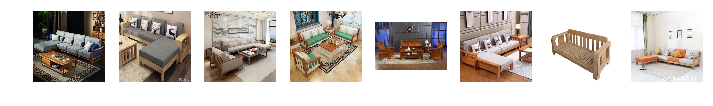

92


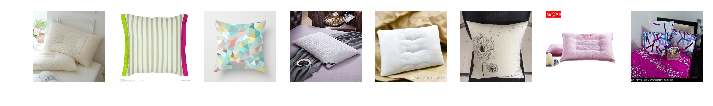

93


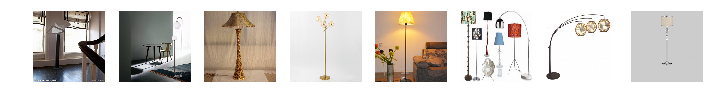

94


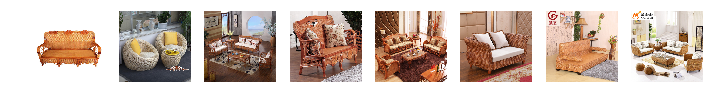

95


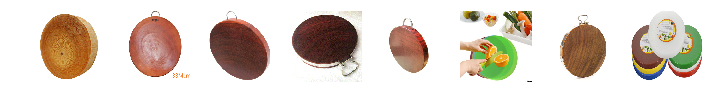

96


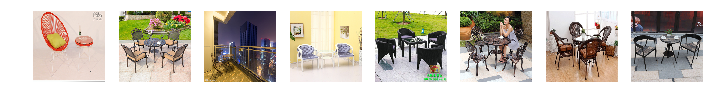

97


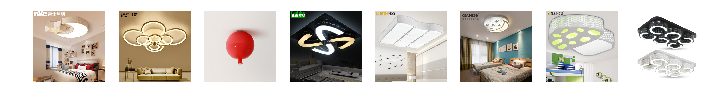

98


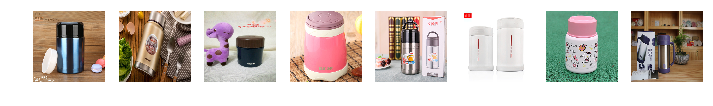

99


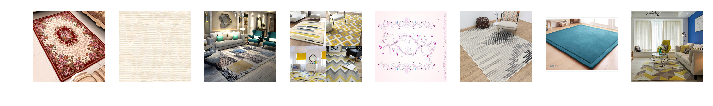

100


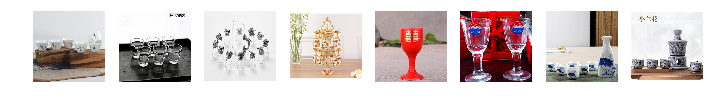

101


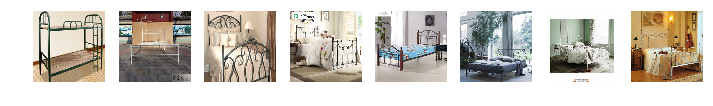

102


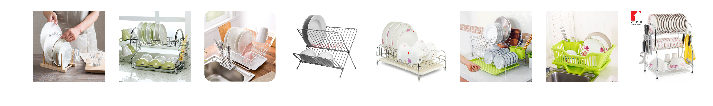

103


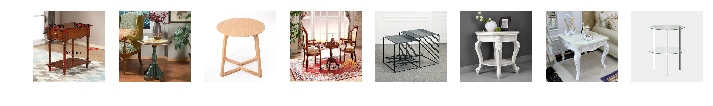

104


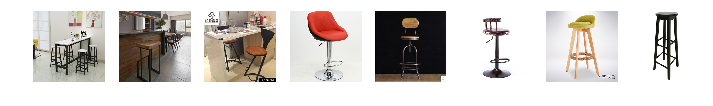

105


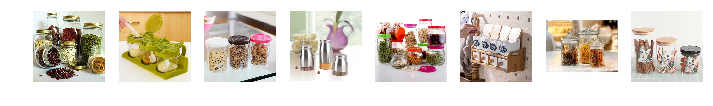

106


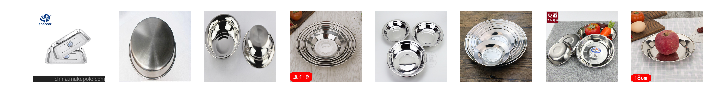

107


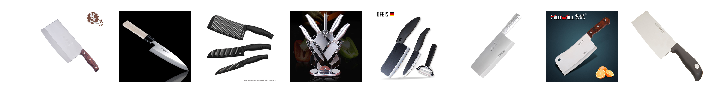

108


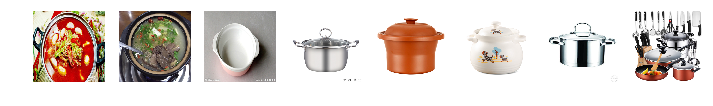

109


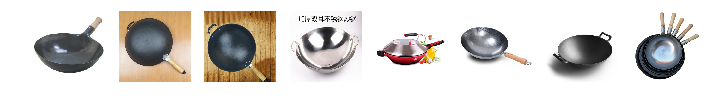

110


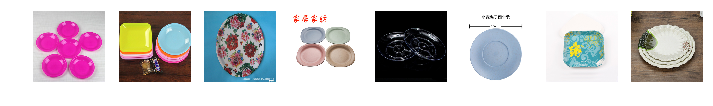

111


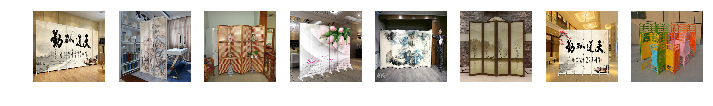

112


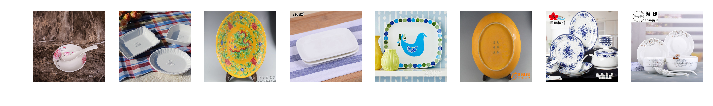

113


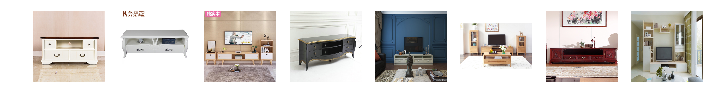

114


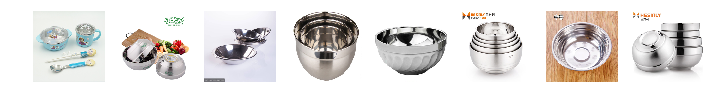

115


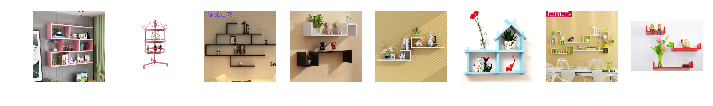

116


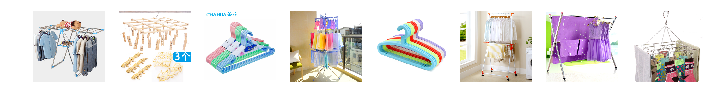

117


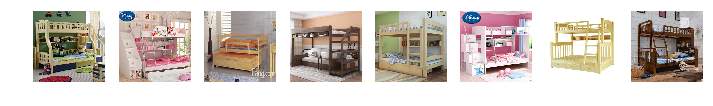

118


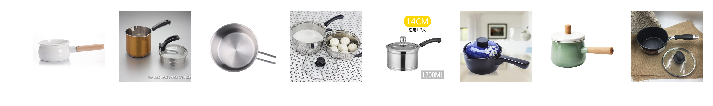

119


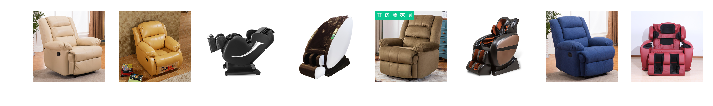

120


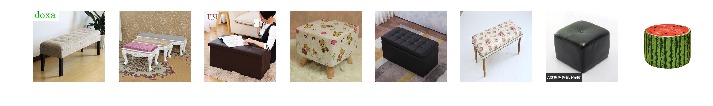

121


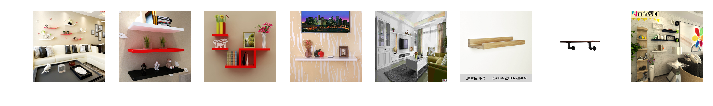

122


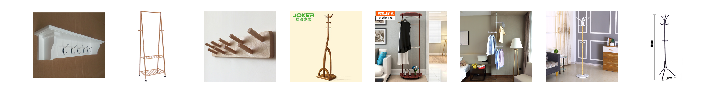

123


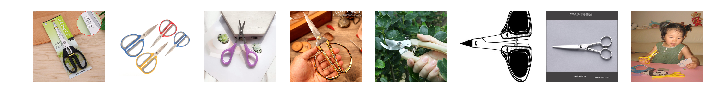

124


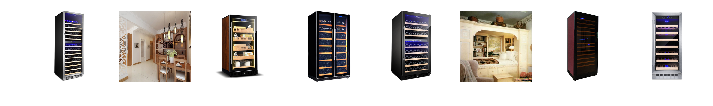

125


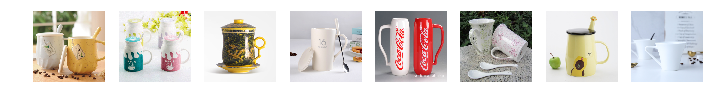

126


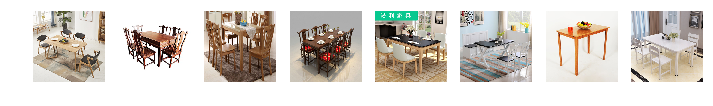

127


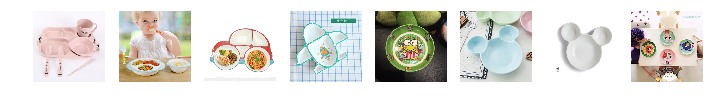

128


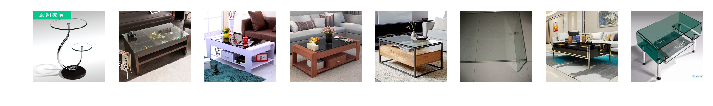

Displayed 1024 images in 00:00:44.56


In [8]:
start = time.time()
for c in sorted(classified.keys()):
    category = classified[c]
    fig=plt.figure(figsize=(12, 12))
    columns = 8
    rows = 1
    for i in range(1, columns*rows +1):
        img=category[i]
        fig.add_subplot(rows, columns, i)
        plt.axis('off')
        plt.imshow(img)
    print(c)
    plt.show()
print('Displayed {} images in {}'.format(columns*rows*len(classified.keys()),elapsed(start)))


In [62]:
#validation dataset 
dataset_name = 'validation_last'
start=time.time()
with h5py.File('data/Sample/{}_images.h5'.format(dataset_name), 'r') as hf:
    images = hf['{}_images'.format(dataset_name)][:]
    print(images.shape)
with h5py.File('data/Sample/{}_labels.h5'.format(dataset_name), 'r') as hf:
    labels = hf['{}_labels'.format(dataset_name)][:]
    print(labels.shape)
print('Loaded {}_dataset in {}'.format(dataset_name,elapsed(start)))

(6203, 300, 300, 3)
(6203,)
Loaded validation_last_dataset in 00:00:00.92


In [63]:
# Create a classes list of used labels
classes = []
for i in range (1,len(labels)):
    if labels[i] not in classes:
        classes.append(labels[i])
        
print(sorted(classes))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128]


In [11]:
# Group images into classified categories
# Caution: This copies images into a new dictionary which doubles the memory use.
classified = {}
for img_class in classes:
    classified[img_class] = []
    count = 0
    for i in range (len(images)):
        image = images[i]
        label = labels[i]
        
        if label == img_class:
            classified[img_class].append(image)
            count +=1
    print(img_class, count)
print(classified.keys())

123 48
24 49
75 46
108 50
72 46
85 50
37 49
33 50
47 50
56 50
124 48
48 49
63 50
42 47
54 50
43 49
99 49
34 48
101 50
87 50
11 49
35 47
113 49
8 49
92 48
94 47
88 50
81 50
128 44
104 50
121 47
82 50
79 50
78 49
119 49
13 47
62 49
61 47
98 50
114 50
30 49
41 48
19 50
9 48
77 50
80 49
95 48
52 49
60 47
15 50
38 50
5 46
86 48
25 47
102 48
110 50
76 46
65 47
53 48
74 45
59 48
106 47
107 50
66 50
17 49
126 48
111 50
109 48
55 48
31 48
44 49
2 50
12 46
49 50
91 47
68 49
20 48
10 47
89 49
73 50
23 47
46 48
67 47
97 50
57 49
3 49
18 47
6 48
118 46
4 48
103 48
28 47
105 49
83 50
22 48
21 48
96 48
64 50
39 47
40 50
14 50
36 47
27 50
16 47
51 49
127 48
7 47
100 50
70 50
45 48
115 49
69 48
125 48
120 49
93 50
116 48
117 50
1 50
32 48
84 45
90 48
122 48
50 49
26 46
112 48
71 48
58 49
29 49
dict_keys([123, 24, 75, 108, 72, 85, 37, 33, 47, 56, 124, 48, 63, 42, 54, 43, 99, 34, 101, 87, 11, 35, 113, 8, 92, 94, 88, 81, 128, 104, 121, 82, 79, 78, 119, 13, 62, 61, 98, 114, 30, 41, 19, 9, 77, 80, 95, 52, 6

Label:  78


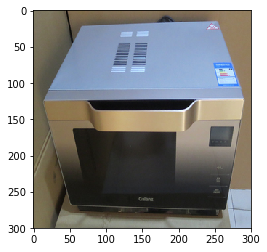

In [64]:
# To display an image
index = 2407
plt.imshow( images[index] )
label = labels[index]
print("Label: ",label)

In [65]:
# To save an image to disk-
#index = 2407 # Select a random image
img = Image.fromarray(np.uint8(images[index]))
#img.save("image_{}.jpg".format(index))

In [66]:
img.size

(300, 300)

In [67]:
#images=np.asarray(images)
#images.shape
images[index].shape

(300, 300, 3)

In [68]:
labels

array([ 16, 123,  24, ..., 110,  37,  55], dtype=int64)

## Image Transformations

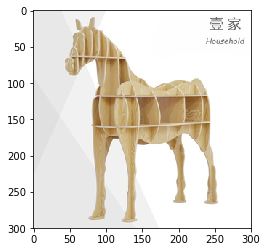

In [71]:
from transforms import Pad
index = 9
plt.imshow( images[index] )
img = Image.fromarray(np.uint8(images[index]))
padded = Pad()(img)

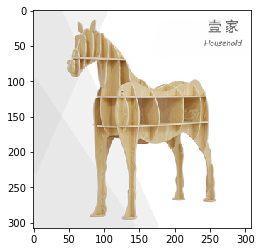

In [72]:
plt.imshow(padded)

In [103]:
from transforms import RandomRotate, HorizontalFlip, normalize, ToNumpy, denormalize

In [104]:
from torchvision import transforms

Original


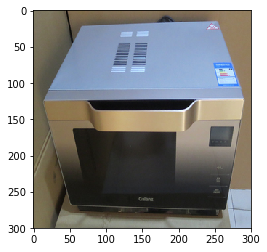

In [29]:
# Original image
print("Original")
fig = plt.figure()
plt.imshow(img)

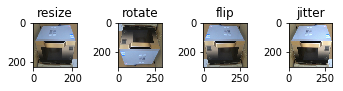

In [105]:
# Apply each of the above transforms on sample.
#for i, tsfrm in enumerate([preprocess, preprocess_hflip, preprocess_with_augmentation]):
resize = transforms.Resize((224, 224))
rotate = RandomRotate()
flip   = HorizontalFlip()
jitter = transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3)

for i, tsfrm in enumerate([resize, rotate, flip, jitter]):
   
    tsfrm_sample = tsfrm(img)

    ax = plt.subplot(1, 5, i + 1)
    plt.tight_layout()
    ax.set_title(['resize', 'rotate', 'flip', 'jitter', 'normal'][i])
    plt.imshow(tsfrm_sample)
plt.show()

In [45]:
print(np.asarray(img).shape)
np.asarray(img)

(300, 300, 3)


array([[[128, 122, 100],
        [126, 121,  99],
        [125, 120,  98],
        ...,
        [145, 125,  98],
        [145, 125,  98],
        [145, 124,  97]],

       [[127, 123, 101],
        [127, 122, 100],
        [127, 122, 100],
        ...,
        [145, 126,  98],
        [143, 123,  96],
        [146, 124,  99]],

       [[126, 120,  98],
        [126, 120,  98],
        [128, 122, 100],
        ...,
        [146, 127,  98],
        [145, 126,  98],
        [146, 125,  98]],

       ...,

       [[124, 117,  88],
        [123, 117,  88],
        [124, 118,  89],
        ...,
        [171, 188, 209],
        [171, 186, 210],
        [170, 186, 208]],

       [[126, 117,  87],
        [126, 117,  88],
        [125, 116,  87],
        ...,
        [172, 187, 210],
        [171, 186, 209],
        [170, 185, 208]],

       [[126, 115,  85],
        [128, 115,  85],
        [127, 116,  85],
        ...,
        [172, 186, 212],
        [171, 186, 209],
        [171, 187, 210]]

In [47]:
normalize(transforms.ToTensor()(img))


( 0 ,.,.) = 
  0.0741  0.0398  0.0227  ...   0.3652  0.3652  0.3652
  0.0569  0.0569  0.0569  ...   0.3652  0.3309  0.3823
  0.0398  0.0398  0.0741  ...   0.3823  0.3652  0.3823
           ...             ⋱             ...          
  0.0056 -0.0116  0.0056  ...   0.8104  0.8104  0.7933
  0.0398  0.0398  0.0227  ...   0.8276  0.8104  0.7933
  0.0398  0.0741  0.0569  ...   0.8276  0.8104  0.8104

( 1 ,.,.) = 
  0.1001  0.0826  0.0651  ...   0.1527  0.1527  0.1352
  0.1176  0.1001  0.1001  ...   0.1702  0.1176  0.1352
  0.0651  0.0651  0.1001  ...   0.1877  0.1702  0.1527
           ...             ⋱             ...          
  0.0126  0.0126  0.0301  ...   1.2556  1.2206  1.2206
  0.0126  0.0126 -0.0049  ...   1.2381  1.2206  1.2031
 -0.0224 -0.0224 -0.0049  ...   1.2206  1.2206  1.2381

( 2 ,.,.) = 
 -0.0615 -0.0790 -0.0964  ...  -0.0964 -0.0964 -0.1138
 -0.0441 -0.0615 -0.0615  ...  -0.0964 -0.1312 -0.0790
 -0.0964 -0.0964 -0.0615  ...  -0.0964 -0.0964 -0.0964
           ...         

In [50]:
print(ToNumpy(normalize(transforms.ToTensor()(img))).shape)
ToNumpy(normalize(transforms.ToTensor()(img)))

(300, 300, 3)


array([[[ 0.07406463,  0.10014006, -0.06152498],
        [ 0.03981499,  0.08263306, -0.07895417],
        [ 0.02269024,  0.06512605, -0.09638336],
        ...,
        [ 0.3651854 ,  0.15266106, -0.09638336],
        [ 0.3651854 ,  0.15266106, -0.09638336],
        [ 0.3651854 ,  0.13515405, -0.11381256]],

       [[ 0.05693974,  0.11764706, -0.04409578],
        [ 0.05693974,  0.10014006, -0.06152498],
        [ 0.05693974,  0.10014006, -0.06152498],
        ...,
        [ 0.3651854 ,  0.17016806, -0.09638336],
        [ 0.33093593,  0.11764706, -0.13124175],
        [ 0.38231018,  0.13515405, -0.07895417]],

       [[ 0.03981499,  0.06512605, -0.09638336],
        [ 0.03981499,  0.06512605, -0.09638336],
        [ 0.07406463,  0.10014006, -0.06152498],
        ...,
        [ 0.38231018,  0.18767506, -0.09638336],
        [ 0.3651854 ,  0.17016806, -0.09638336],
        [ 0.38231018,  0.15266106, -0.09638336]],

       ...,

       [[ 0.00556549,  0.01260505, -0.2706753 ],
        [-0

In [60]:
temp = ToNumpy(normalize(transforms.ToTensor()(img)))

In [67]:
new = (1/(2*2.25)) * temp + 0.5
# https://stackoverflow.com/questions/47318871/valueerror-floating-point-image-rgb-values-must-be-in-the-0-1-range-while-usi
#you must re-scale them to the range 0.0 - 1.0.
#You want to retain visibility of negative vs positive, but that you let 0.5 be your new "neutral" point. 
#Scale such that current 0.0 values map to 0.5, and your most extreme value (largest magnitude) scale to 0.0 (if negative) or 1.0 (if positive).
#It looks like the values are in the range -2.25 to +2.0. I suggest a rescaling new = (1/(2*2.25)) * old + 0.5

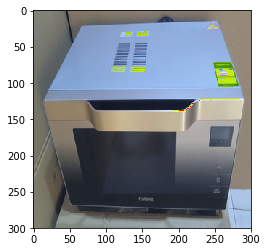

In [62]:
plt.imshow(new)

In [93]:
temp1 = denormalize(temp)

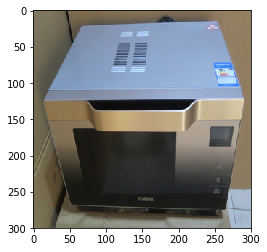

In [94]:
plt.imshow(temp1)

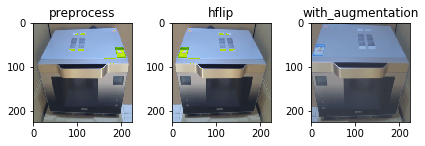

In [107]:
from transforms import preprocess, preprocess_hflip, preprocess_with_augmentation
for i, tsfrm in enumerate([preprocess, preprocess_hflip, preprocess_with_augmentation]):
   
    tsfrm_sample = tsfrm(img)
    tsfrm_sample = ToNumpy(tsfrm_sample)
    tsfrm_sample = (1/(2*2.25)) * tsfrm_sample + 0.5
    ax = plt.subplot(1, 3, i + 1)
    plt.tight_layout()
    ax.set_title(['preprocess', 'hflip', 'with_augmentation'][i])
    plt.imshow(tsfrm_sample)
plt.show()

# Load Test Data

In [6]:
# To read test file(using soem of train data from the competition)
test_file = 'data/Sample/test_images_146.h5'

with h5py.File(test_file, 'r') as hf:
        test_images = hf['train']['images'][:]
        test_labels= hf['train']['labels'][:]
print(test_images.shape)
print(test_labels.shape)

(1000, 224, 224, 3)
(1000,)


I downloaded this from somebody's google-drive, they have already resized images to 224 X 224.

# Testing experiment set-up

In [2]:
bs = 4

In [24]:
from transforms import preprocess, preprocess_hflip, preprocess_with_augmentation
data_transforms = {
    'train': preprocess_with_augmentation ,
    'val': preprocess,
    'test':[preprocess, preprocess_hflip, preprocess_with_augmentation]
}

In [25]:
image_datasets = {x: FurnitureDataset(x, transform=data_transforms[x])
                  for x in ['train', 'val']}

In [26]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=0)
              for x in ['train', 'val']}

In [27]:
dataset_sizes = {x: image_datasets[x].len for x in ['train', 'val']}

In [28]:
dataset_sizes

{'train': 20000, 'val': 6203}

In [29]:
# Get a batch of training data
#pdb.set_trace()
#%prun 
inputs, classes = next(iter(dataloaders['train']))

get_item
tra <torchvision.transforms.transforms.Compose object at 0x00000212904CC2B0>
get_item
tra <torchvision.transforms.transforms.Compose object at 0x00000212904CC2B0>
get_item
tra <torchvision.transforms.transforms.Compose object at 0x00000212904CC2B0>
get_item
tra <torchvision.transforms.transforms.Compose object at 0x00000212904CC2B0>


In [22]:
type(inputs)

torch.FloatTensor

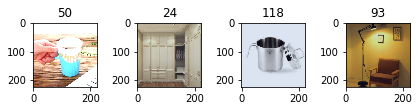

In [21]:
def imshow(images, classes):
    for idx,tsfrm_sample in enumerate(images):
        tsfrm_sample = ToNumpy(tsfrm_sample)
        tsfrm_sample = (1/(2*2.25)) * tsfrm_sample + 0.5
        tsfrm_sample = np.clip(tsfrm_sample, 0, 1)
        ax = plt.subplot(1, 4, idx + 1)
        ax.set_title(classes[idx])
        plt.tight_layout()
        plt.imshow(tsfrm_sample)
imshow(inputs, classes)

In [6]:
model = models.Model(net_name='resnet18')

In [57]:
from torchsummary import summary
#https://github.com/sksq96/pytorch-summary
#summary(your_model, input_size=(channels, H, W))
summary(model, input_size=(3,config.IMAGE_SIZE, config.IMAGE_SIZE))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]            9408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           36864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]           36864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]           36864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [58]:
model.display()

conv1 weight  : non-trainable
bn1 weight  : non-trainable
bn1 bias  : non-trainable
layer1 0.conv1.weight  : non-trainable
layer1 0.bn1.weight  : non-trainable
layer1 0.bn1.bias  : non-trainable
layer1 0.conv2.weight  : non-trainable
layer1 0.bn2.weight  : non-trainable
layer1 0.bn2.bias  : non-trainable
layer1 1.conv1.weight  : non-trainable
layer1 1.bn1.weight  : non-trainable
layer1 1.bn1.bias  : non-trainable
layer1 1.conv2.weight  : non-trainable
layer1 1.bn2.weight  : non-trainable
layer1 1.bn2.bias  : non-trainable
layer2 0.conv1.weight  : non-trainable
layer2 0.bn1.weight  : non-trainable
layer2 0.bn1.bias  : non-trainable
layer2 0.conv2.weight  : non-trainable
layer2 0.bn2.weight  : non-trainable
layer2 0.bn2.bias  : non-trainable
layer2 0.downsample.0.weight  : non-trainable
layer2 0.downsample.1.weight  : non-trainable
layer2 0.downsample.1.bias  : non-trainable
layer2 1.conv1.weight  : non-trainable
layer2 1.bn1.weight  : non-trainable
layer2 1.bn1.bias  : non-trainable
lay

In [59]:
print(model)

Model(
  (net): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    (relu): ReLU(inplace)
    (maxpool): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), s

In [11]:
feature_extract_lyrs = torch.nn.Sequential(*list(model.net.children())[:8])

In [12]:
print(feature_extract_lyrs)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d

## Experiment 1 : Resnet18 , Data Augmentation, TTA and Cosine Annealing with Restarts 

<b> fast.ai inspiration : easy steps to train a world-class image classifier </b>

1. precompute=True
2. Use lr_find() to find highest learning rate where loss is still clearly improving
3. Train last layer from precomputed activations for 1-2 epochs
4. Train last layer with data augmentation (i.e. precompute=False) for 2-3 epochs with cycle_len=1
5. Unfreeze all layers
6. Set earlier layers to 3x-10x lower learning rate than next higher layer
7. Use lr_find() again
8. Train full network with cycle_mult=2 until over-fitting

In [3]:
classifier = Classifier(title='Resnet18CosAnneal', ds_class_name='FurnitureDataset', batch_size=4)

dataset_sizes {'train': 20000, 'val': 6203}
optimizer set as :  <torch.optim.sgd.SGD object at 0x0000027B93CA8B00>
criterion set as : cross-entropy loss


In [5]:
classifier.find_lr()

KeyboardInterrupt: 

In [4]:
#pick a value a bit before the minimum, where the loss still improves
base_lr = 1e-4

In [5]:
classifier.fit('last',lrs=[base_lr]) #train last layers from precomputed activations , data augmentation is turned off

Sequential(
  (0): AvgPool2d(kernel_size=7, stride=1, padding=0, ceil_mode=False, count_include_pad=True)
)
Sequential(
  (0): Linear(in_features=512, out_features=128, bias=True)
)
Epoch 0/1
----------
Loss: 3.5004 Acc: 0.2832
Epoch 1/1
----------
Loss: 2.2499 Acc: 0.5144


optimizer set as :  <torch.optim.sgd.SGD object at 0x0000027BE1A5EFD0>
LR scheduler set up : <lr_scheduler_new.CosineAnnealingLR_with_Restart object at 0x0000027BE1A5EEF0>
criterion set as : cross-entropy loss
Starting training
Epoch 0/2
----------
restart at epoch 001
next goal 1
T_max 2
train Loss: 2.6064 Acc: 0.3724
val Loss: 2.0145 Acc: 0.4891

Epoch 1/2
----------
restart at epoch 002
next goal 1
T_max 3
train Loss: 2.0715 Acc: 0.4703
val Loss: 1.8637 Acc: 0.5325

Epoch 2/2
----------
restart at epoch 003
next goal 1
T_max 4
train Loss: 1.8806 Acc: 0.5165
val Loss: 1.8342 Acc: 0.5446

Training complete in 17m 45s
Min val loss: 1.834204


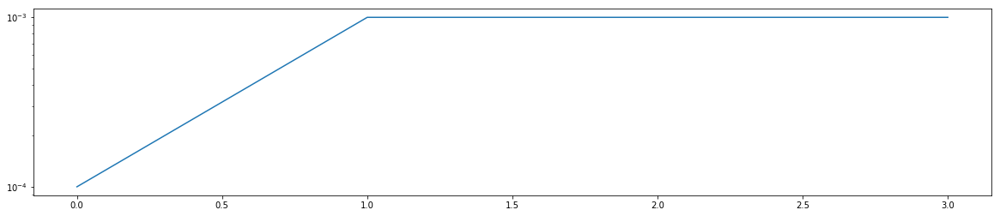

In [6]:
classifier.fit(num_epochs=3, lrs=[base_lr])      

In [19]:
optim_params = list(filter(lambda p: p.requires_grad, classifier.model.net.parameters()))

In [20]:
optim_params

[Parameter containing:
  3.3909e-02  1.2221e-02  4.0607e-02  ...  -7.1329e-03  2.2605e-03  2.4425e-02
 -3.5701e-02  8.2152e-03 -4.9943e-02  ...  -4.4888e-03  3.5639e-02 -1.0781e-02
 -5.3484e-02  2.6123e-02 -2.3188e-02  ...   2.3166e-02  2.2039e-02 -1.7091e-04
                 ...                   ⋱                   ...                
  4.2095e-03 -1.6579e-02 -7.6049e-02  ...   3.8377e-02  3.2222e-02  1.0322e-02
 -5.7984e-02  6.7799e-03  7.0103e-02  ...   2.9705e-02 -7.8338e-03  3.4800e-02
  2.6545e-02  6.2536e-03  2.9538e-02  ...   4.2467e-02 -2.7795e-03 -1.2563e-02
 [torch.cuda.FloatTensor of size 128x512 (GPU 0)], Parameter containing:
 1.00000e-02 *
  -0.3884
   2.7080
  -0.8174
  -0.4023
   4.3060
   3.0767
  -1.4692
   4.1240
   2.2055
  -0.6256
   0.6729
  -3.3363
   1.7536
   0.8809
   4.6062
   0.6043
  -1.7199
   2.1645
  -1.7119
  -1.7094
  -2.7955
   0.2745
   1.1230
   4.0091
   1.8981
   3.0124
   3.9809
  -2.1325
   3.0330
  -3.8973
  -2.0415
  -3.3415
   0.9044
  -1.2

In [22]:
[{key: value for key, value in classifier.scheduler.__dict__.items() if key not in {'optimizer', 'is_better'}}]

[{'T_max': 4,
  'T_mult': 1,
  'Te': 1,
  'base_lrs': [0.0001],
  'current_epoch': 0,
  'eta_min': 0,
  'last_epoch': 2,
  'lr_history': [[0.0001], [0.0], [0.0], [0.0]],
  'model': Model(
    (net): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (maxpool): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
          (relu): ReLU(inplace)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kern

In [11]:
classifier.optimizer.param_groups

[{'dampening': 0,
  'initial_lr': 0.0001,
  'lr': 0.0,
  'momentum': 0.9,
  'nesterov': False,
  'params': [],
  'weight_decay': 0}]

In [14]:
for parameter in classifier.model.optim_params:
    print(parameter)

In [14]:
for parameter in classifier.model.get_optim_params():
    print("parameter")

In [19]:
 classifier.model.get_optim_params()

here


<generator object Module.parameters at 0x00000220C2E80D58>

In [15]:
[x[0] for x in classifier.scheduler.lr_history]

[0.001, 0.0, 0.0005]

In [17]:
[y for y in range(3)]

[0, 1, 2]

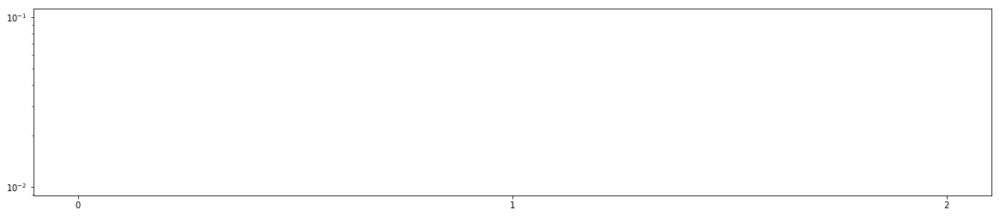

In [18]:
fig, ax = plt.subplots(figsize=(20, 4))
ax.scatter(range(3),[x[0] for x in classifier.scheduler.lr_history])
ax.set_yscale("log")
ax.xaxis.set_ticks(np.arange(0, 3, 1))
plt.show()